In [1]:
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.animation as animation
plt.style.use(['dark_background'])

import matplotlib.collections

import numpy as np
import pandas as pd
import scipy.io as sio
from scipy.io import loadmat

import os

In [2]:
cell_data_path = r"C:\Users\zfj\data\quadpatch\Raw Data .mat"
raw_data_path = r"C:\Users\zfj\data\quadpatch\Raw Data .h5"
cell_id = "20220805Dcc2"

In [3]:
m = loadmat(os.path.join(cell_data_path, f"{cell_id}.mat"), squeeze_me=True, struct_as_record=False)
# m = loadmat(os.path.join(cell_data_path, f"{cell_id}.mat"), squeeze_me=True)#, struct_as_record=False)

In [4]:
def visit(f, depth=0):
    if type(f) == np.ndarray and f.dtype == object:
        for i,field in enumerate(f):
            print('\t'*depth, f"{i}:")
            visit(field, depth = depth + 1)
    elif type(f) == sio.matlab._mio5_params.mat_struct:
        for field in f._fieldnames:
            a = getattr(f,field)
            if type(a) == np.ndarray:
                astr = f"({len(a)})"
            else:
                astr = ""
            print('\t'*depth, field, astr)
            visit(a, depth = depth + 1)
    else:
        print('\t'*depth, f)

visit(m['data'])

 Stimulus (3)
	 0:
		 Name 
			 Light Step
		 Params 
			 NDF1 
				 1
			 NDF2 
				 4
			 Intensity 
				 1
			 RstarIntensity 
				 1989.85
			 MeanLevel 
				 0.5
			 RstarMeanLevel 
				 994.925
			 BackgroundSize 
				 1000
			 PreTime 
				 0.5
			 StimTime 
				 1
			 TailTime 
				 1
			 framesPerStep (0)
				 []
			 epochNum (13)
				 [ 41  42  43  44  45  94  95  96  97  98  99 100 101]
			 StagePosition (2)
				 [-653  729]
			 SpotSize 
				 500
		 RawData 
			 SplitParameter 
				 chan1Hold
			 SplitValue 
				 -60
			 Data (4)
				 0:
					 [[-246.875 -241.25  -239.375 ... -226.25  -206.25  -205.   ]
 [-146.25  -148.125 -143.125 ... -143.75  -141.25  -144.375]
 [-286.25  -273.75  -263.75  ... -139.375 -132.5   -111.875]
 ...
 [ -83.75   -83.75   -80.625 ...  -76.875  -87.5    -87.5  ]
 [ -71.875  -73.125  -77.5   ... -121.875 -128.75  -121.25 ]
 [-111.875 -105.     -92.5   ...  -83.125  -82.5    -86.25 ]]
				 1:
					 [[-338.125 -338.75  -340.625 ... -371.875 -369.375 -

[[0.   0.25]
 [0.5  0.75]]


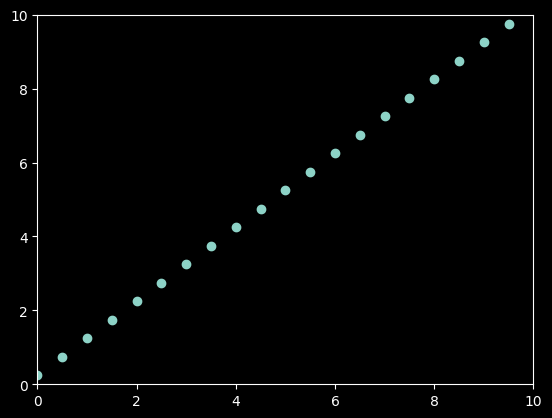

In [5]:
#8-by- (306-by-7)
#X,Y,intensity,startTime,endTime,diameter,flickerFrequency
# print([x.shape for x in m['data'].Stimulus[1].Params.ShapeDataMatrix])
plt.scatter(m['data'].Stimulus[1].Params.ShapeDataMatrix[0][:,3], m['data'].Stimulus[1].Params.ShapeDataMatrix[0][:,4])
plt.xlim([0,10])
plt.ylim([0,10])
print(m['data'].Stimulus[1].Params.ShapeDataMatrix[0][:2,3:5])
#preTime, tailTime = 0.25




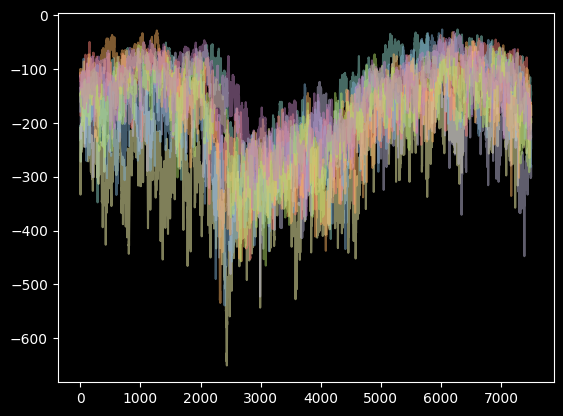

(array([  2.,   1.,   0.,   2.,   3.,   5.,  12.,   9.,   9.,  15.,  29.,
        30.,  44.,  64.,  77.,  88., 112., 118., 127., 127., 139., 157.,
       141., 133., 111.,  98., 108.,  93., 123., 109., 112., 122., 198.,
       175., 238., 209., 352., 303., 381., 510., 438., 492., 433., 398.,
       344., 331., 175., 119.,  78.,   6.]), array([-415.625 , -407.8375, -400.05  , -392.2625, -384.475 , -376.6875,
       -368.9   , -361.1125, -353.325 , -345.5375, -337.75  , -329.9625,
       -322.175 , -314.3875, -306.6   , -298.8125, -291.025 , -283.2375,
       -275.45  , -267.6625, -259.875 , -252.0875, -244.3   , -236.5125,
       -228.725 , -220.9375, -213.15  , -205.3625, -197.575 , -189.7875,
       -182.    , -174.2125, -166.425 , -158.6375, -150.85  , -143.0625,
       -135.275 , -127.4875, -119.7   , -111.9125, -104.125 ,  -96.3375,
        -88.55  ,  -80.7625,  -72.975 ,  -65.1875,  -57.4   ,  -49.6125,
        -41.825 ,  -34.0375,  -26.25  ]), <BarContainer object of 50 artists>)

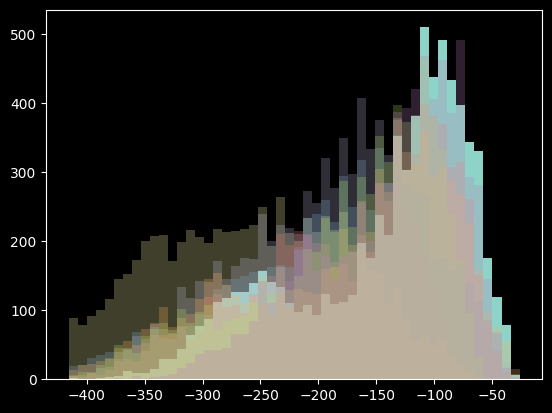

In [24]:
# plt.plot(m['data'].Stimulus[1].RawData.Data[0].T)
plt.plot(m['data'].Stimulus[1].RawData.Data[0].T[1522500:1530000,:], alpha=.5)

plt.show()

bins = plt.hist(m['data'].Stimulus[1].RawData.Data[0].T[1522500:1530000,0], bins=50)
print(bins)
for i in range(1,8):
    plt.hist(m['data'].Stimulus[1].RawData.Data[0].T[1522500:1530000,i], bins=bins[1], alpha=.25)


X,Y,intensity,startTime,endTime,diameter,flickerFrequency


(-137.5, 137.5, -134.5947815048315, 127.3779031399612)

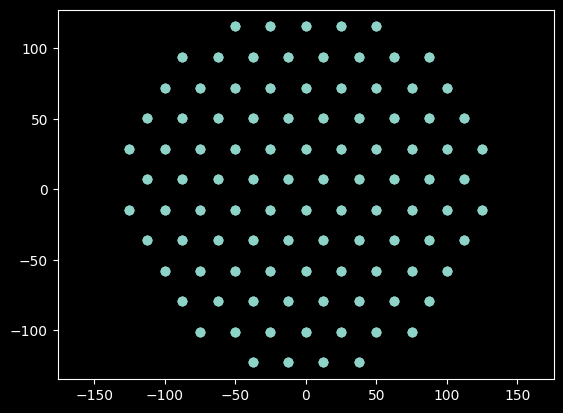

In [25]:
print(m['data'].Stimulus[1].Params.ShapeDataColumns[0])
m['data'].Stimulus[1].Params.ShapeDataMatrix[0]

#diam 23.5um, intensity 1, flicker none,

plt.scatter(m['data'].Stimulus[1].Params.ShapeDataMatrix[0][:,0], m['data'].Stimulus[1].Params.ShapeDataMatrix[0][:,1])
plt.axis('equal')

In [26]:
m['data'].Stimulus[1].RawData.Data[0].shape

(8, 1542500)

In [27]:
(
    dict(zip(m['data'].Stimulus[1].Params.ShapeDataColumns[0].split(','),m['data'].Stimulus[1].Params.ShapeDataMatrix[0][0,:])),
    dict(zip(m['data'].Stimulus[1].Params.ShapeDataColumns[0].split(','),m['data'].Stimulus[1].Params.ShapeDataMatrix[0][-1,:])),
)

({'X': -112.5,
  'Y': 7.216878364870351,
  'intensity': 1.0,
  'startTime': 0.0,
  'endTime': 0.25,
  'diameter': 23.5,
  'flickerFrequency': 0.0},
 {'X': 62.5,
  'Y': 93.81941874331422,
  'intensity': 1.0,
  'startTime': 152.5,
  'endTime': 152.75,
  'diameter': 23.5,
  'flickerFrequency': 0.0})

In [28]:
np.concatenate((m['data'].Stimulus[1].Params.ShapeDataMatrix[0], np.ones((306,1))), axis=1).shape
# np.ones(306,1)

(306, 8)

In [6]:
sd = np.concatenate([np.concatenate((sdm, i*np.ones((len(sdm),1))), axis=1) for i,sdm in enumerate(m['data'].Stimulus[1].Params.ShapeDataMatrix)], axis=0)
print(sd.shape)
u, ui = np.unique(sd[:,:2], axis = 0, return_inverse = True)
print(u.shape, ui.shape)

(2448, 8)
(102, 2) (2448,)


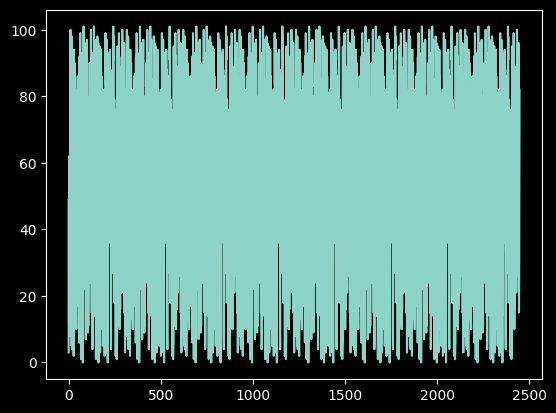

In [30]:
plt.plot(ui)

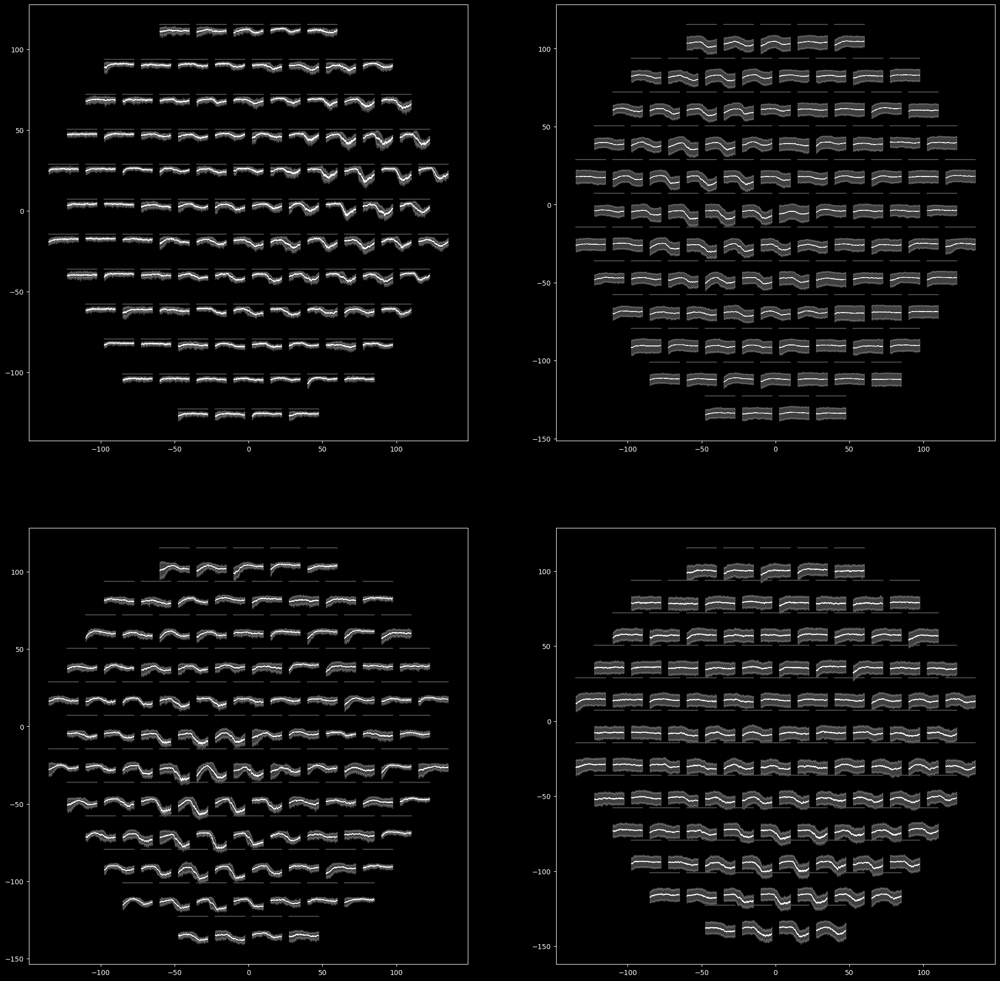

In [9]:
xs = np.linspace(-20/2,20/2,5000)
sc = 30
bl = 0

rd = m['data'].Stimulus[1].RawData.Data

c = np.empty((4, len(u)))

di = np.empty((4, len(u), 5000))


tii = np.linspace(-.05,.45,5000)

_,axs = plt.subplots(2,2,figsize=(25,25))
axs = axs.flatten()
for j in [0,1,2,3]: #cells
    for i in range(len(u)):
        x,y = u[i]
        t0,tf = sd[ui==i,3:5].T
        ti = sd[ui==i,-1].astype(int)
        
        t0 = (t0*10000).astype(int) + 1250# +2500 #- 500# - 2500
        tf = (tf*10000).astype(int) + 1250 + 2500# +2500 #+ 2000# - 2500
        
        keep = t0 > 0
        t0 = t0[keep]
        tf = tf[keep]        
        
        d = np.empty((len(t0), 5000))
        for k,(tt0,ttf,tti) in enumerate(zip(t0,tf,ti)):
            d[k, :] = rd[j][tti, tt0:ttf]

        axs[j].plot(xs + x, y * np.ones(xs.shape), color=[.3,.3,.3])   
        axs[j].fill_between(
            xs + x, 
            (d.mean(axis=0) + d.std(axis=0) - bl)/sc + y,
            (d.mean(axis=0) - d.std(axis=0) - bl)/sc + y, 
            color='w', alpha = .25)
        axs[j].plot(xs + x, (d.mean(axis=0) - bl)/sc + y, 'w', linewidth=.5)

        c[j,i] = np.percentile(d.mean(axis=0), 80) - np.percentile(d.mean(axis=0), 20)
        
        di[j, i, :] = (d - d[:, tii<0].mean(axis=1, keepdims=True)).mean(axis=0)
        # c[j,i] = d.mean(axis=0).max() - d.mean(axis=0).min()
        # c[j,i] = -d.mean(axis=0).min()

In [32]:
u.shape

(102, 2)

In [33]:
nc = 4
_,axs = plt.subplots(2,nc,figsize=(25,8), gridspec_kw={'height_ratios':[1,.3]})

# di = np.empty((4, len(u), 5000))
# psth = np.empty((u.shape[1], nc, 11501))

for c in range(nc):
    ri = di[c,:,:] - di[c,:,:].mean(axis=0, keepdims=True)
    l,v = np.linalg.eig(np.cov(ri))
    
    # if the max abs loading is negative, flip it
    # if v[np.abs(v[:,0]).argmax(),0] < 0:
    #     v[:,0] = -v[:,0]
    v[:,0] /= v[np.abs(v[:,0]).argmax(),0] 

    #can't reuse artists...
    patches = [plt.Circle(cxy,12) for cxy in u]
    coll = matplotlib.collections.PatchCollection(patches)


    # coll.set_array(np.abs(v[:,0]))
    coll.set_array(v[:,0])
    axs[0,c].add_collection(coll)

    axs[0,c].axis('square')

    if c==0:
        axs[0,c].set_ylabel('Vertical position')
    axs[0,c].set_xlabel('Horizontal position')
    
    comp = v[:,0] @ ri
    comp /= comp[np.abs(comp).argmax()]
    axs[1,c].plot(np.linspace(-.05,.45,5000), -comp)

    
    if c==0:
        axs[1,c].set_ylabel('Amplitude (A.U.)')
    axs[1,c].set_xlabel('Time (s)')

Error in callback <function flush_figures at 0x000002504F6A7280> (for post_execute):


KeyboardInterrupt: 

In [ ]:
m['data'].Stimulus[1].Params.ShapeDataMatrix[0][0,:],m['data'].Stimulus[1].Params.ShapeDataMatrix[1][0,:],

(array([-112.5       ,    7.21687836,    1.        ,    0.        ,
           0.25      ,   23.5       ,    0.        ]),
 array([-112.5       ,    7.21687836,    1.        ,    0.        ,
           0.25      ,   23.5       ,    0.        ]))

In [10]:
data = []
for j in [0,1,2,3]: #cells
    dd = []
    for i in range(len(u)):
        x,y = u[i]
        t0,tf = sd[ui==i,3:5].T
        ti = sd[ui==i,-1].astype(int)
        
        t0 = (t0*10000).astype(int) +1250 #+ 2500 #- 500 - 2500
        tf = (tf*10000).astype(int) +1250 + 2500 #+ 2000 - 2500
        
        keep = t0 > 0
        t0 = t0[keep]
        tf = tf[keep]        
        
        d = np.empty((len(t0), 5000))
        # d = np.empty((len(rd[j]), len(t0), 5000))
        for k,(tt0,ttf,tti) in enumerate(zip(t0,tf,ti)):
            # d[:, k, :] = rd[j][:, tt0:ttf]
            d[k, :] = rd[j][tti, tt0:ttf]
        dd.append(d)
    data.append(dd)

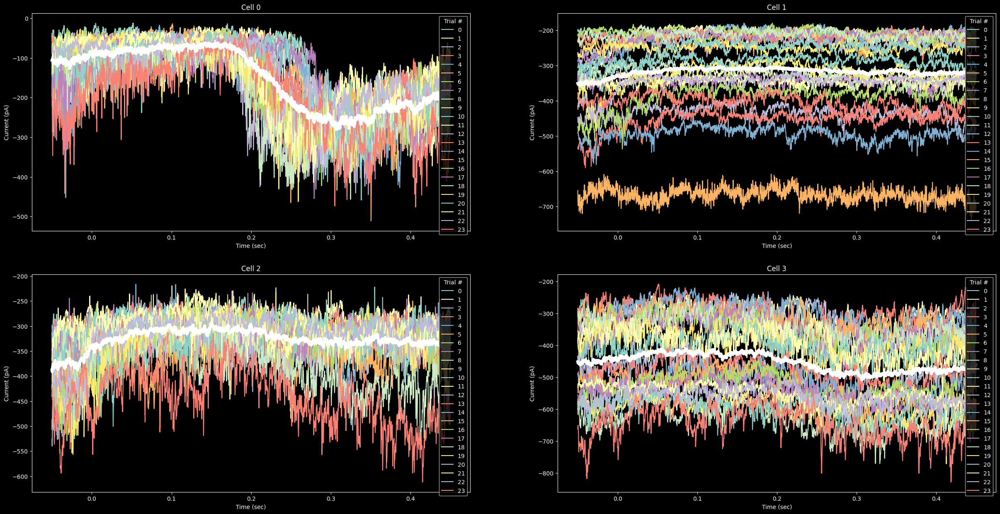

In [11]:
# plt.plot(d[:,:,:1500].mean(axis=-1).flatten())
[d.shape for d in dd]

di = 101

_,axs = plt.subplots(2,2,figsize=(30,15))
# plt.plot(dd[0][:,:,:500].mean(axis=-1).flatten())
for j,ax in enumerate(axs.flat):
    plt.sca(ax)
    for i in range(len(data[j][di])):
        plt.plot(np.linspace(-.05,.45,5000),data[j][di][i, :], label=str(i))
    plt.plot(np.linspace(-.05,.45,5000),data[j][di].mean(axis=0), 'w', linewidth=5)
    plt.xlabel('Time (sec)')
    plt.ylabel('Current (pA)')
    plt.legend(title='Trial #')
    plt.title(f'Cell {j}')


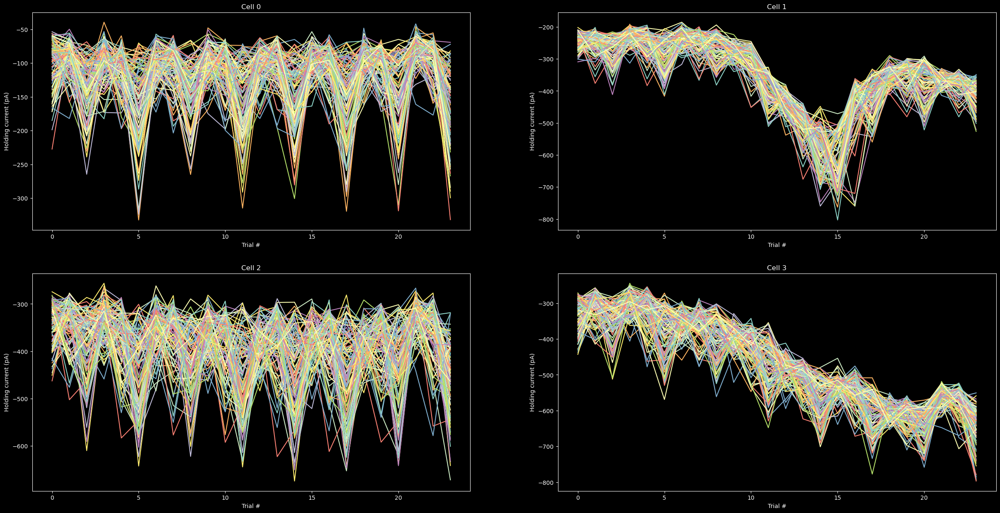

In [ ]:

_,axs = plt.subplots(2,2,figsize=(30,15))
for j,ax in enumerate(axs.flat):
    plt.sca(ax)
    for i in range(102):
        plt.plot(data[j][i][:,:500].mean(axis=1).reshape((8,-1)).flatten())
    plt.title(f'Cell {j}')
    plt.xlabel('Trial #')
    plt.ylabel('Holding current (pA)')

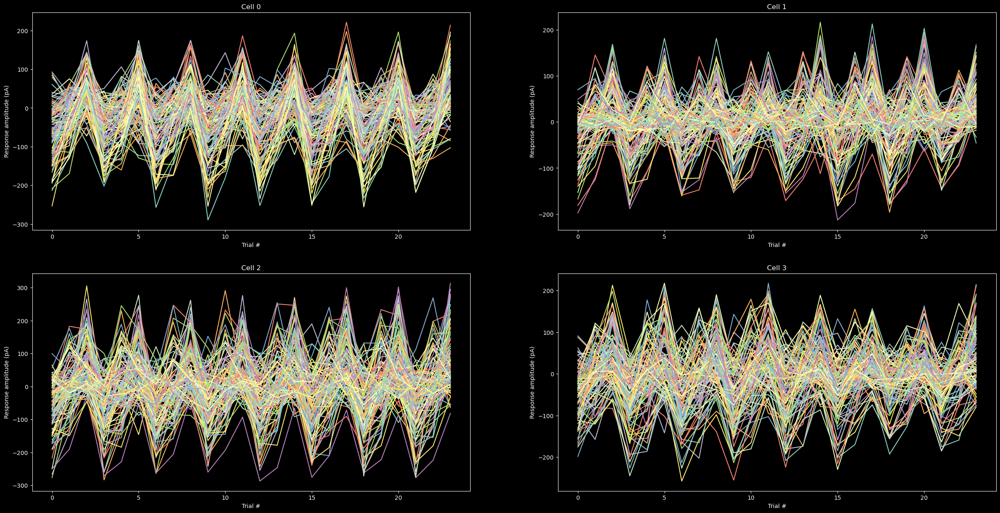

In [ ]:

_,axs = plt.subplots(2,2,figsize=(30,15))
for j,ax in enumerate(axs.flat):
    plt.sca(ax)
    for i in range(102):
        plt.plot(data[j][i][:,2500:3500].mean(axis=1).reshape((8,-1)).flatten() - data[j][i][:,:500].mean(axis=1).reshape((8,-1)).flatten())
        # plt.plot(np.percentile(data[j][i][:,2500:3500],80,axis=1) - np.percentile(data[j][i][:,:500],20,axis=1))
    plt.title(f'Cell {j}')
    plt.xlabel('Trial #')
    plt.ylabel('Response amplitude (pA)')

In [12]:
#data should be shape... 102*(?) x 4 x 5000

ui.shape
# m['data'].Stimulus[1].Params.ShapeDataMatrix[0].shape
# 8 * 306
# 
# ui = 
dmat = np.stack([np.concatenate(data[i]) for i in range(4)])
dmat = np.moveaxis(dmat, 0, 1)
dui = np.concatenate([np.ones(len(data[0][i]), dtype=int)*i for i in range(len(data[0]))])
dui.shape, dmat.shape

((2448,), (2448, 4, 5000))

In [ ]:
# u.max()
u[dui].shape

(2440, 2)

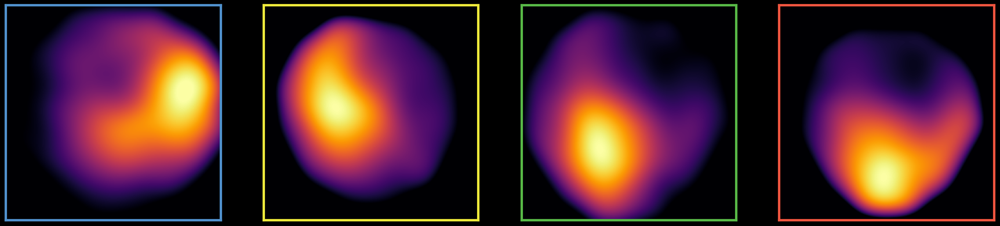

In [ ]:
from sklearn.decomposition import PCA
from scipy.stats import gaussian_kde

colors = [
    "#5091CD",
    "#EDE93B",
    "#58B947",
    "#EF553F",
]


X,Y = np.meshgrid(np.linspace(-125,125,250), np.linspace(-125,125,250))
treg = 50

_,axs = plt.subplots(1,4,figsize=(22,5))

for i in range(4):
    plt.sca(axs[i])

    pca = PCA(1)
    pcs = pca.fit_transform(dmat[:,i,:])

    kern = gaussian_kde(u[dui].T, weights = pcs[:,-1] - pcs[:,-1].min())
    Z = kern.evaluate([X.flatten(), Y.flatten()])
    plt.imshow(Z.reshape(X.shape), origin='lower', extent=[-125,125,-125,125], cmap='inferno')

    plt.clim(Z.reshape(X.shape)[
        treg:-treg,treg:-treg].min(), Z.reshape(X.shape)[treg:-treg,treg:-treg].max())

    # cl = np.percentile(Z, [25,99.9])
    # plt.clim(cl[0],cl[1])

    # plt.axis('off')
    # plt.gca().invert_xaxis()
    # plt.gca().invert_yaxis()
    plt.xticks([])
    plt.yticks([])

    axs[i].spines['bottom'].set_color(colors[i])
    axs[i].spines['top'].set_color(colors[i]) 
    axs[i].spines['right'].set_color(colors[i])
    axs[i].spines['left'].set_color(colors[i])

    axs[i].spines['bottom'].set_linewidth(3)
    axs[i].spines['top'].set_linewidth(3)
    axs[i].spines['right'].set_linewidth(3)
    axs[i].spines['left'].set_linewidth(3)


plt.show()



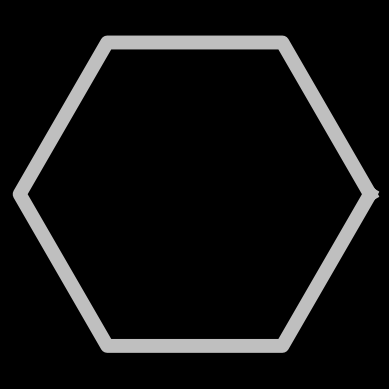

In [ ]:
theta = np.linspace(0,2*np.pi, 7)
plt.figure().add_subplot(projection='polar')

plt.plot(theta, np.ones_like(theta), '#FFFFFFC0', linewidth=10)
plt.axis('off')

plt.savefig('hexagon.png',transparent=True)

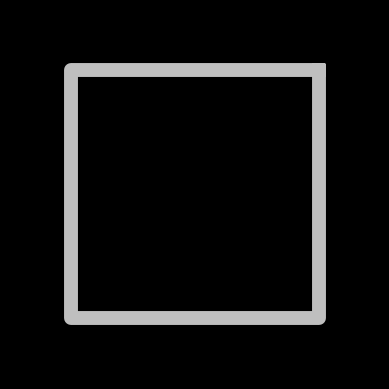

In [ ]:
theta = np.linspace(0,2*np.pi, 5) + np.pi/4
plt.figure().add_subplot(projection='polar')

plt.plot(theta, np.ones_like(theta), '#FFFFFFC0', linewidth=10)
plt.axis('off')

plt.savefig('square.png',transparent=True)

In [13]:
#pc signal-noise angle stuff
# dmat.shape, dui.shape, u.shape

from sklearn.decomposition import PCA
s = np.empty((dmat.shape[0],4))
for i in range(4):
    pca = PCA(1)
    s[:,i] = pca.fit_transform(dmat[:,i]).flatten()
s.shape

(2448, 4)

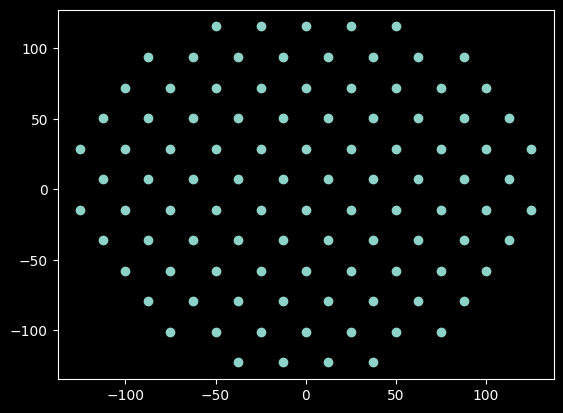

In [28]:
# u.min(axis=0), u.max(axis=0)
plt.scatter(*u.T)

In [33]:
# plt.hist2d(s[dui==0,0], s[dui==0,1])
u.shape

(102, 2)

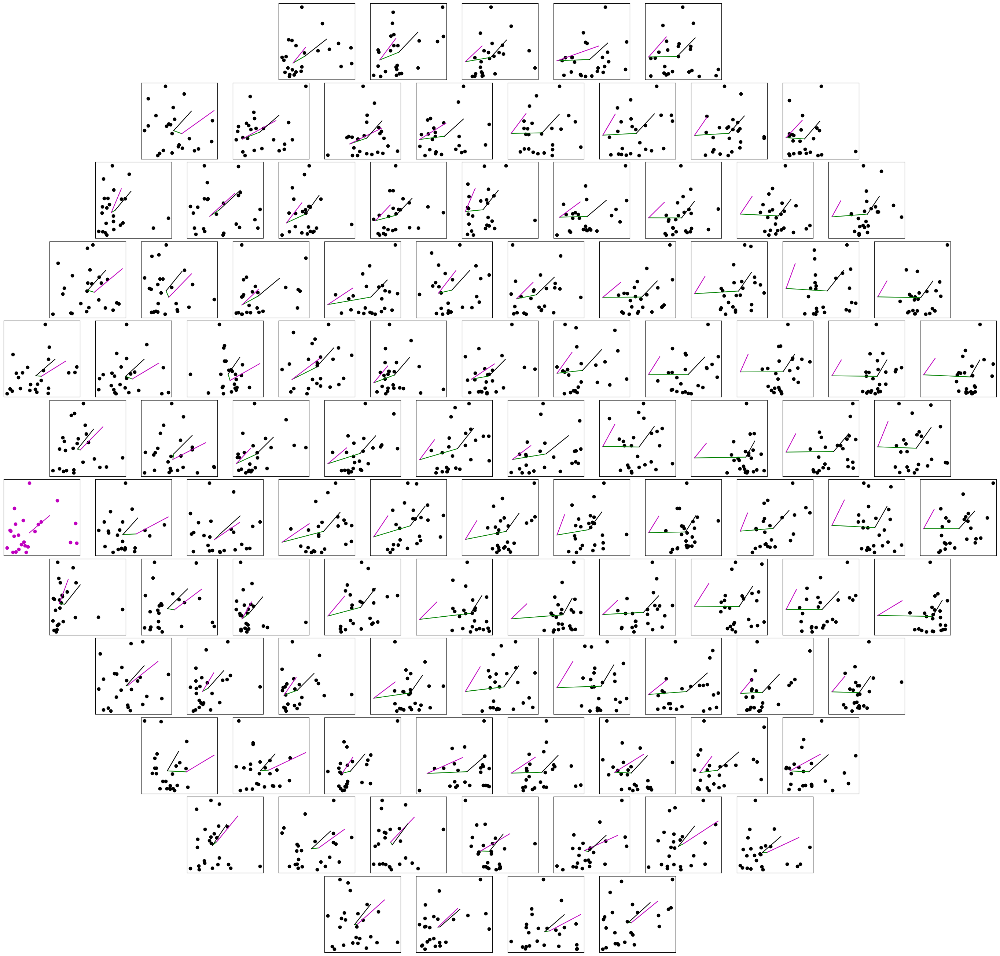

In [40]:
plt.figure(figsize=(25,25), facecolor='w')


for t in range(1):
    ax = plt.axes([*((u[t]+125)/250), 1/12, 1/12])
    ax.set_facecolor('w')
    ax.spines['bottom'].set_color('k')
    ax.spines['top'].set_color('k') 
    ax.spines['right'].set_color('k')
    ax.spines['left'].set_color('k')
    plt.xticks([])
    plt.yticks([])
    
    plt.scatter(s[dui==0,0], s[dui==0,1],c='m')#, c=dui, cmap='tab20')
    plt.plot([s[dui==0,0].mean(), s[dui==0,0].mean() + s[dui==0,0].std()], [s[dui==0,1].mean(), s[dui==0,1].mean() + s[dui==0,1].std()],'m')
    
    
for t in range(1,102):

    ax = plt.axes([*((u[t]+125)/250), 1/12, 1/12])
    
    ax.set_facecolor('w')    
    ax.spines['bottom'].set_color('k')
    ax.spines['top'].set_color('k') 
    ax.spines['right'].set_color('k')
    ax.spines['left'].set_color('k')
    plt.xticks([])
    plt.yticks([])



    plt.scatter(s[dui==t,0], s[dui==t,1],c='k')#, c=dui, cmap='tab20')

    #signal noise angle

    # 1) signal vector: mu2 - mu1
    plt.plot([s[dui==t,0].mean(), s[dui==0,0].mean(),], [s[dui==t,1].mean(), s[dui==0,1].mean()],'g')

    # 2) noise angle from covariance matrix?
    plt.plot([s[dui==0,0].mean(), s[dui==0,0].mean() + s[dui==0,0].std()], [s[dui==0,1].mean(), s[dui==0,1].mean() + s[dui==0,1].std()],'m')
    
    plt.plot([s[dui==t,0].mean(), s[dui==t,0].mean() + s[dui==t,0].std()], [s[dui==t,1].mean(), s[dui==t,1].mean() + s[dui==t,1].std()],'k')





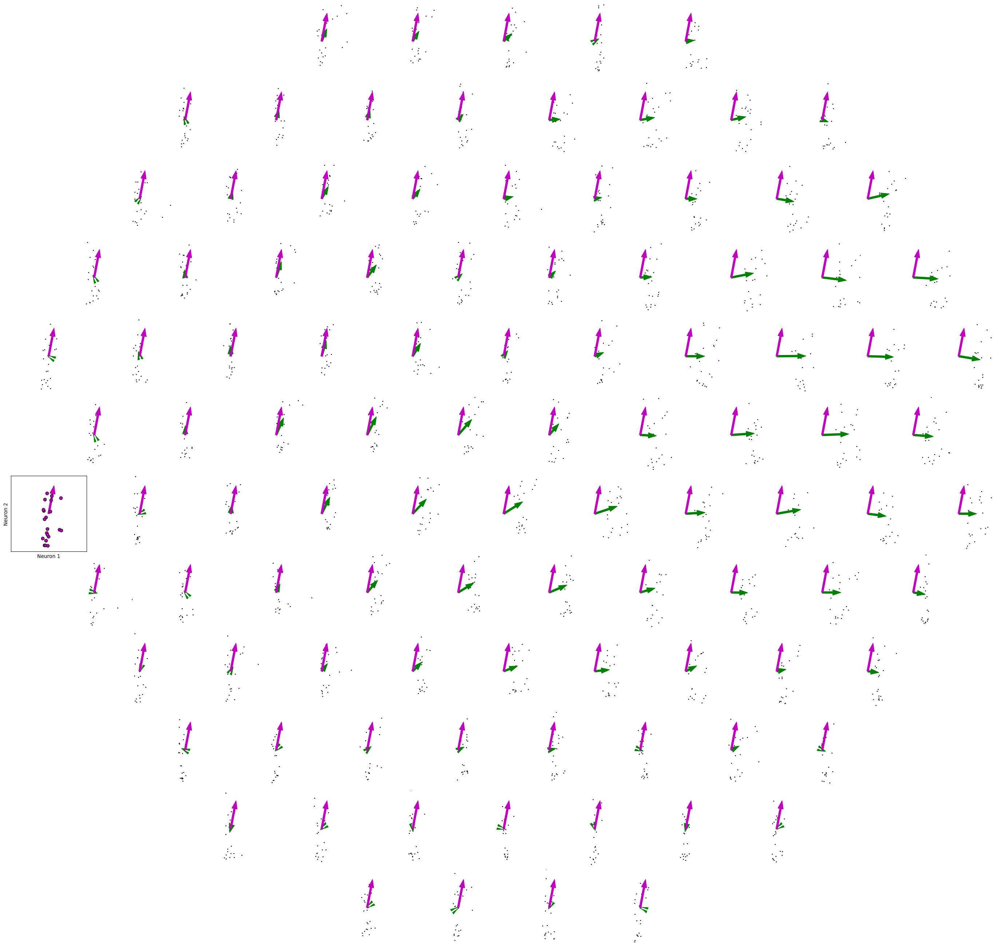

In [60]:
plt.figure(figsize=(25,25), facecolor='w')



mx = np.max(np.abs(np.asarray([s[dui==t,0].mean()-s[dui==0,0].mean() for t in range(1,102)])))
my = np.max(np.abs(np.asarray([s[dui==t,1].mean()-s[dui==0,1].mean() for t in range(1,102)])))
# my = max([s[dui==t,1].mean()-s[dui==0,1].mean() for t in range(1,102)])
m = max(mx, my) * 1.3
for t in range(1):
    ax = plt.axes([*((u[t]+125)/250), 1/12, 1/12])
    ax.set_facecolor('w')
    ax.spines['bottom'].set_color('k')
    ax.spines['top'].set_color('k') 
    ax.spines['right'].set_color('k')
    ax.spines['left'].set_color('k')
    plt.xticks([])
    plt.yticks([])
    
    plt.arrow(0,0, s[dui==0,0].std(), s[dui==0,1].std(), color='m', width=500, length_includes_head=True)
    plt.scatter(s[dui==0,0] - s[dui==0,0].mean(), s[dui==0,1] - s[dui==0,1].mean(),c='m', edgecolor='k')#, c=dui, cmap='tab20')
    # plt.plot([s[dui==0,0].mean(), s[dui==0,0].mean() + s[dui==0,0].std()], [s[dui==0,1].mean(), s[dui==0,1].mean() + s[dui==0,1].std()],'m')
    
    plt.xlim([-m,m])
    plt.ylim([-m,m])
    plt.xlabel('Neuron 1', color='k')
    plt.ylabel('Neuron 2', color='k')
    
    
    

for t in range(1,102):

    ax = plt.axes([*((u[t]+125)/250), 1/12, 1/12])
    
    ax.set_facecolor('w')    
    # ax.spines['bottom'].set_color('k')
    # ax.spines['top'].set_color('k') 
    # ax.spines['right'].set_color('k')
    # ax.spines['left'].set_color('k')
    # plt.xticks([])
    # plt.yticks([])
    plt.axis('off')



    plt.scatter(s[dui==t,0] - s[dui==0,0].mean(), s[dui==t,1] - s[dui==0,1].mean(), s=1,c='k')#, c=dui, cmap='tab20')

    #signal noise angle

    # # 1) signal vector: mu2 - mu1
    # plt.plot([s[dui==t,0].mean(), s[dui==0,0].mean(),], [s[dui==t,1].mean(), s[dui==0,1].mean()],'g')

    plt.arrow(0,0, s[dui==t,0].mean()-s[dui==0,0].mean(), s[dui==t,1].mean()-s[dui==0,1].mean(), color='g', width=500, length_includes_head=True)
    plt.arrow(0,0, s[dui==0,0].std(), s[dui==0,1].std(), color='m', width=500, length_includes_head=True)
    plt.xlim([-m,m])
    plt.ylim([-m,m])
    
    
    


    # # 2) noise angle from covariance matrix?
    # plt.plot([s[dui==0,0].mean(), s[dui==0,0].mean() + s[dui==0,0].std()], [s[dui==0,1].mean(), s[dui==0,1].mean() + s[dui==0,1].std()],'m')
    
    # plt.plot([s[dui==t,0].mean(), s[dui==t,0].mean() + s[dui==t,0].std()], [s[dui==t,1].mean(), s[dui==t,1].mean() + s[dui==t,1].std()],'k')





In [40]:

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import KFold
from keras.utils import to_categorical 

cv = KFold(5, shuffle=True, random_state=0)
dat = np.moveaxis(dmat[:,:,::50],1,2)
train, test = list(cv.split(dat, dui))[0]

xtrain, xtest = dat[train], dat[test]
ytrain, ytest = u[dui[train],None,:], u[dui[test],None,:]
ltrain, ltest = to_categorical(dui[train,None,None]), to_categorical(dui[test,None,None])

ncells = 4

In [41]:
xtrain.shape, xtest.shape, ltest.shape, u.shape

((1958, 100, 4), (490, 100, 4), (490, 1, 102), (102, 2))

In [127]:
# tmri = layers.Input((None,ncells))
# tmii = layers.LayerNormalization()(tmri)
# ffns = []
# cnv1 = tmii
# for _ in range(2):
#     for i in range(6):
#         cnv1 = layers.SeparableConv1D(32, 2, dilation_rate=2**i, padding='causal')(cnv1)
#         cnv1 = layers.LayerNormalization()(cnv1)
#         cnv1 = layers.Activation('relu')(cnv1)
#         cnv1 = layers.SeparableConv1D(ncells, 2, dilation_rate=2**i, padding='causal')(cnv1)
#         cnv1 = layers.LayerNormalization()(cnv1)
#         cnv1 = layers.Add()([cnv1, tmri])
#         ffns.append(cnv1)
#     cnv1 = layers.Add()([*ffns, tmri])
# ffnt = layers.Activation('sigmoid')(cnv1)
# ffnt = layers.Dense(2)(ffnt)


xtrain = xtrain.reshape((xtrain.shape[0],1,-1))
xtest = xtest.reshape((xtest.shape[0],1,-1))

# mod = keras.Model(inputs=tmri, outputs = ffnt)
# mod.summary()



# tmi = layers.Input((1,100*ncells))
# # cnv = layers.Concatenate()([layers.Conv1D(1, int(i), padding='causal', activation='relu')(tmi) for i in np.linspace(8.0, 64.0, 16)])
# tmii = layers.Flatten()(tmi)
# # tmii = layers.LayerNormalization()(tmii)
# tmii = layers.Dense(512)(tmii)

# ffn = layers.Dense(512, activation='relu')(tmi)
# ffn = layers.Add()([tmii, ffn])
# ffn = layers.LayerNormalization()(ffn)
# for i in range(6):
#     ffn = layers.Dense(512, activation='relu')(ffn)
#     ffn = layers.Add()([tmii, ffn])
#     ffn = layers.LayerNormalization()(ffn)
# # ffn = layers.Dense(512, activation='relu')(ffn)
# # ffn = layers.Add()([tmii, ffn])
# # ffn = layers.Dense(2)(ffn)
# ffn = layers.Dense(102, activation='softmax')(ffn)
# mod = keras.Model(inputs=tmi, outputs = ffn)
# mod.summary()


width = 128
depth = 6

tmi = layers.Input((1,ncells * 100))
ffn = layers.Dense(width, activation='relu')(tmi)
tmii = layers.LayerNormalization()(ffn)
ffn = tmii

for i in range(depth):
    ffn = layers.Dense(width, activation='relu')(ffn)
    ffn = layers.Add()([tmii, ffn])
    ffn = layers.LayerNormalization()(ffn)

ffn = layers.Dense(2)(ffn)
mod = keras.Model(inputs=tmi, outputs = ffn)
mod.summary()


Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 1, 400)]     0           []                               
                                                                                                  
 dense_61 (Dense)               (None, 1, 128)       51328       ['input_7[0][0]']                
                                                                                                  
 layer_normalization_54 (LayerN  (None, 1, 128)      256         ['dense_61[0][0]']               
 ormalization)                                                                                    
                                                                                                  
 dense_62 (Dense)               (None, 1, 128)       16512       ['layer_normalization_54[0]

In [101]:
xtrain.shape

(1958, 1, 400)

In [128]:
# mod.compile(
#     # loss = keras.losses.MeanSquaredError(),
#     loss = 'categorical_crossentropy',
#     optimizer=keras.optimizers.Adam(learning_rate=0.001),
#     metrics='accuracy'
# )
# # history = mod.fit(xtrain, ytrain, validation_data=(xtest,ytest), epochs=200, callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss',restore_best_weights=True, patience=10, verbose=1))
# history = mod.fit(xtrain, ltrain, validation_data=(xtest,ltest), epochs=200, callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',restore_best_weights=True, patience=20, verbose=1))

mod.compile(
    # loss = 'categorical_crossentropy',
    loss = 'mse',
    # loss = 'absolute_error',
    
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    metrics=tf.keras.metrics.RootMeanSquaredError()
)
history = mod.fit(xtrain, ytrain, validation_data=(xtest,ytest), epochs=200, callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss',restore_best_weights=True, patience=10, verbose=1))
# history = mod.fit(xtrain, ltrain, validation_data=(xtest,ltest), epochs=200, callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',restore_best_weights=True, patience=20, verbose=1))


Epoch 1/200
62/62 [==============================] - 4s 37ms/step - loss: 3904.0818 - root_mean_squared_error: 62.4827 - val_loss: 3372.6208 - val_root_mean_squared_error: 58.0743
Epoch 2/200
62/62 [==============================] - 1s 12ms/step - loss: 3072.5278 - root_mean_squared_error: 55.4304 - val_loss: 2857.0686 - val_root_mean_squared_error: 53.4516
Epoch 3/200
62/62 [==============================] - 1s 11ms/step - loss: 2496.6628 - root_mean_squared_error: 49.9666 - val_loss: 2115.0679 - val_root_mean_squared_error: 45.9899
Epoch 4/200
62/62 [==============================] - 1s 10ms/step - loss: 2149.9712 - root_mean_squared_error: 46.3678 - val_loss: 1929.0710 - val_root_mean_squared_error: 43.9212
Epoch 5/200
62/62 [==============================] - 1s 11ms/step - loss: 1759.2184 - root_mean_squared_error: 41.9430 - val_loss: 1707.4697 - val_root_mean_squared_error: 41.3215
Epoch 6/200
62/62 [==============================] - 1s 12ms/step - loss: 1574.8806 - root_mean_squa

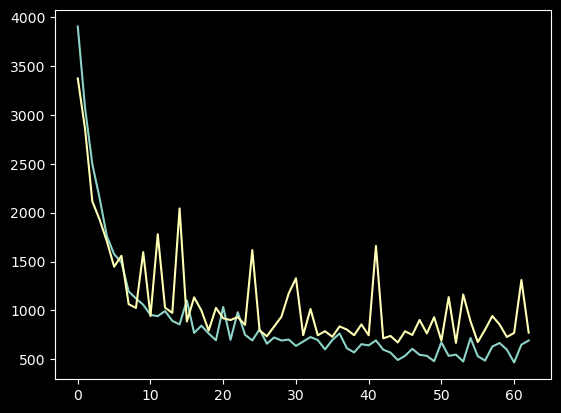

In [129]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

In [130]:
xtest.shape, ytest.shape

((490, 1, 400), (490, 1, 2))

In [133]:
# mod.predict(xtest).shape
# scores = mod.evaluate(xtest, ltest, verbose=1)
# print(scores)
ypred = mod.predict(xtest)
# ypred = mod.evaluate(xtest, ytest, verbose=1)
ypred.shape
# ypred = ypred[:, None, :]

16/16 [==============================] - 0s 7ms/step


(490, 1, 2)

In [134]:
# lpred.shape
# 
# ypred = u[np.argmax(lpred, axis=2)]

err = np.sqrt(np.sum((ypred - ytest)**2,axis=-1))
# plt.hist(err)


#randomly permute the ptest
# calculate the average error
err_b = np.empty(1000)
for k in range(1000):
    err_b[k]= np.sqrt(np.sum((np.random.permutation(ypred)[:,-1,:] - ytest[:,0,:])**2, axis=1)).mean()


Text(0, 0.5, 'Frequency')

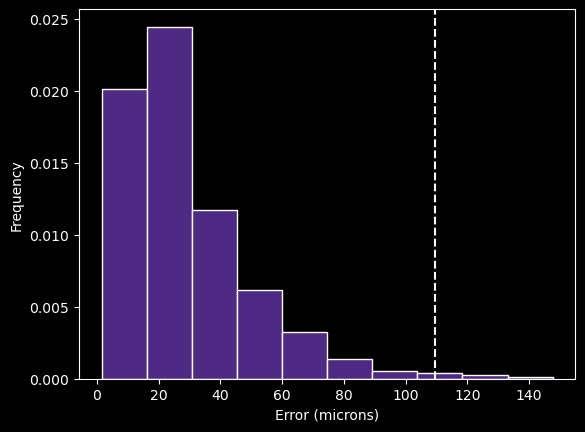

In [135]:

# plt.show()
plt.hist(err, density=True, color='#4E2A84',edgecolor='w')

# plt.axvline(np.percentile(err_b,.05),0,1,color='w',zorder=-1)
plt.axvline(np.percentile(err_b,.05),0,1,color='w',linestyle='--')
plt.xlabel('Error (microns)')
plt.ylabel('Frequency')

In [49]:
print(ytest[i[0],-1], ytest[i[1],-1])

print(ypred[i[0],-1], ypred[i[1],-1])

TypeError: 'int' object is not subscriptable

In [136]:
n = 1000

d = np.empty((n,1000))
b = np.empty((n,1000))

for j in range(1000):
    for k in range(n):
        i = np.random.choice(len(ytest), 2, replace=False)
        # print(ytest[i])
        
        d[k,j] = np.sqrt(np.sum((ytest[i[0],-1] - ytest[i[1],-1])**2))
        b[k,j] = np.dot((ytest[i[0],-1] - ytest[i[1],-1]), (ypred[i[0],-1] - ypred[i[1],-1])) >= 0

    # b[d == 0] = 0.5




In [137]:
# # d,tdi,cnt = np.unique(d.astype(int),return_inverse=True, return_counts=True)
# td,tdi,cnt = np.unique(d//10,return_inverse=True, return_counts=True)
# # bs = np.array([b[tdi==i].std() for i in range(len(d))])
# # b = np.array([b[tdi==i].mean() for i in range(len(d))])
# # # tdi.shape
# # d = d[1:] * 10
# # b = b[1:]
# # bs = bs[1:]
# # cnt = cnt[1:]


di = np.zeros(26) * np.nan
bsi = np.zeros(26) * np.nan
bi = np.zeros(26) * np.nan

di[0] = 0
bi[0] = 0.5
bsi[0] = 0

for i in range(25):
    j = (d > (i*10)) & (d <= (10*(i+1)))
    if not np.count_nonzero(j):
        print(i)
        continue
    
    di[i+1] = np.array([dj[jj].mean() for dj,jj in zip(d,j)]).mean()
    bi[i+1] = np.array([bj[jj].mean() for bj,jj in zip(b,j)]).mean()
    bsi[i+1] = np.array([bj[jj].mean() for bj,jj in zip(b,j)]).std()

bi = bi[~np.isnan(bi)]
di = di[~np.isnan(di)]
bsi = bsi[~np.isnan(bsi)]

# [bj[jj].mean() for bj,jj in zip(b,j)]
# i = 0
# j = (d > (i*10)) & (d <= (10*(i+1)))
# j.shape
# plt.imshow(j)
# plt.hist(d.flatten())
# np.unique(d)

0
1
3


C:\Users\zfj\AppData\Local\Temp\ipykernel_2564\3525035812.py:26: RuntimeWarning: Mean of empty slice.
  di[i+1] = np.array([dj[jj].mean() for dj,jj in zip(d,j)]).mean()
c:\Users\zfj\anaconda3\envs\suite2p\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\zfj\AppData\Local\Temp\ipykernel_2564\3525035812.py:27: RuntimeWarning: Mean of empty slice.
  bi[i+1] = np.array([bj[jj].mean() for bj,jj in zip(b,j)]).mean()
C:\Users\zfj\AppData\Local\Temp\ipykernel_2564\3525035812.py:28: RuntimeWarning: Mean of empty slice.
  bsi[i+1] = np.array([bj[jj].mean() for bj,jj in zip(b,j)]).std()


25.0

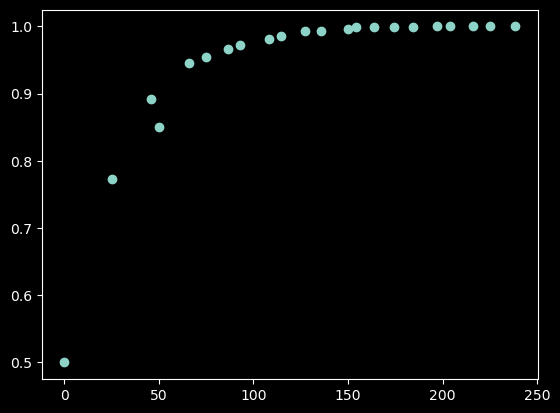

In [138]:
# np.unique(d.astype(int))
# di.shape, bi.
# plt.scatter(d,b)
plt.scatter(di,bi)
# bi[0]
di[1]

C:\Users\zfj\AppData\Local\Temp\ipykernel_2564\1424060068.py:2: RuntimeWarning: overflow encountered in exp
  return 1. / (1 + np.exp(-k*x))


(100,) 0.04205382492318528
26.123956398135345


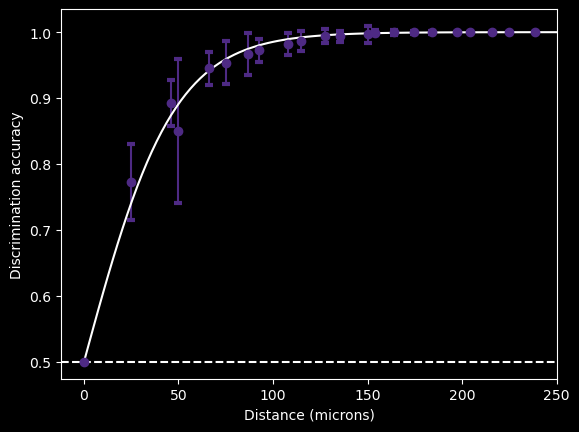

In [139]:
def logifunc(x,k):
        return 1. / (1 + np.exp(-k*x))

from scipy.optimize import curve_fit

# popt, pcov = curve_fit(logifunc, d[0], b[0])#, p0=[.63, ])

# popt, pcov = curve_fit(logifunc, d.flatten(), b.flatten())#, p0=[.63, ])
popt, pcov = curve_fit(logifunc, di, bi, p0=[.63])#, p0=[.63, ])

# print(popt, pcov)
ei = np.linspace(0, d.max(), 100)
e = logifunc(ei, *popt)
print(e.shape, *popt)


plt.errorbar(di,bi,bsi, linestyle='none', marker='o', capsize=3, capthick=3)

# plt.plot(ei,e)
xl = plt.xlim()
yl = plt.ylim()
plt.cla()
plt.errorbar(di,bi,bsi, linestyle='none', marker='o', color="#4E2A84", capsize=3, capthick=3)
# plt.boxplot()
plt.plot(ei, e, 'w')


plt.axhline(0.5,0,1,color='w',linestyle='--')

plt.xlim(xl)
# plt.ylim(yl)

# print(ei[np.argwhere(e>=.75)[0,0]])

plt.xlabel('Distance (microns)')
plt.ylabel('Discrimination accuracy')

print(np.log(1/3)/-popt[0])

In [149]:
ytest.shape, ypred.shape, err.shape

((490, 1, 2), (490, 1, 2), (490, 1))

C:\Users\zfj\AppData\Local\Temp\ipykernel_2564\2527806123.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = mpl.cm.get_cmap('inferno')
C:\Users\zfj\AppData\Local\Temp\ipykernel_2564\2527806123.py:26: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, pad=.001)


(-137.5005245743757,
 137.50042223530212,
 -134.5953255270491,
 140.40562128262872)

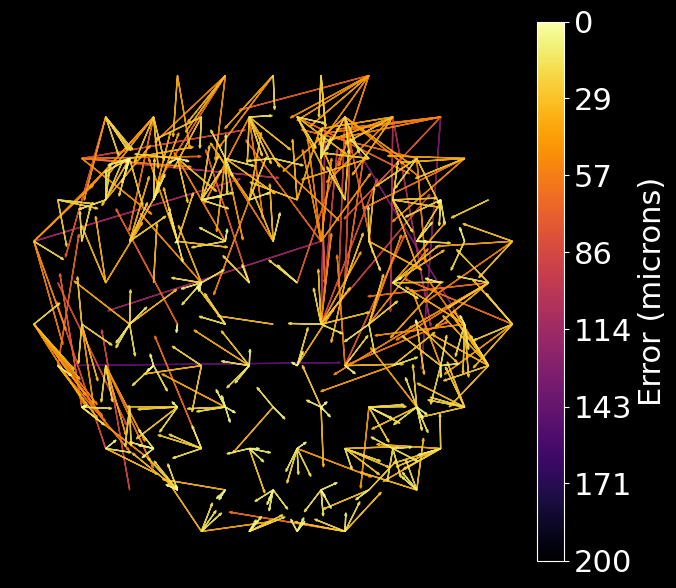

In [199]:
ptest = ypred.copy()

import matplotlib as mpl

err = np.sqrt(np.sum((ptest - ytest)**2, axis=-1)).flatten()

clim = [0, 200]

cmap = mpl.cm.get_cmap('inferno')
norm = mpl.colors.Normalize(vmin=-clim[1], vmax=-clim[0])

plt.figure(figsize=(8,7))

ii = np.flip(np.argsort(err))

for k in range(len(ytest)):
    i = ii[k]
    # plt.quiver(ytest[:,0,0], ytest[:,0,1], 300*(ptest[:,0,0] - ytest[:,0,0]), 300*(ptest[:,0,1] - ytest[:,0,1]), angles='xy')
    # plt.arrow(ytest[i,0], ytest[i,1], ptest[i,0] - ytest[i,0], ptest[i,1] - ytest[i,1], color=cmap(norm(-err[i])), length_includes_head=True, head_width=1, alpha=.9)
    plt.arrow(ytest[i,0,0], ytest[i,0,1], ptest[i,0,0] - ytest[i,0,0], ptest[i,0,1] - ytest[i,0,1], color=cmap(norm(-err[i])), length_includes_head=True, head_width=1, alpha=.9)
# ytest.squeeze().shape, ptest.shape


sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)

cbar = plt.colorbar(sm, pad=.001)
cbar.set_label('Error (microns)')
cbar.ax.set_yticks(np.linspace(-clim[1],-clim[0],8))
cbar.ax.set_yticklabels([f"{abs(i):0.0f}" for i in np.linspace(-clim[1],-clim[0],8)])

plt.axis('square')
plt.axis('off')

In [151]:
def get_thresh(y,p, do_plotting = False):
    from scipy.optimize import curve_fit
    def logifunc(x,k):
        return 1. / (1 + np.exp(-k*x))


    N = len(y)

    i = np.triu_indices(N, 1)
    vyx = (y[:,None,0] - y[None,:,0])[i]
    vpx = (p[:,None,0] - p[None,:,0])[i]    
    vyy = (y[:,None,1] - y[None,:,1])[i]
    vpy = (p[:,None,1] - p[None,:,1])[i]

    d = np.sqrt(vyx**2 + vyy**2)
    b = ((vyx * vpx) + (vyy * vpy)) > 0

    k, _ = curve_fit(logifunc, d, b, p0=0.027)

    if do_plotting:
        di, ji = np.unique(np.round(d*100)/100, return_inverse=True)
        ndists = len(di)

        bsi = np.zeros(ndists)
        bi = np.zeros(ndists)

        for i in range(1,ndists):
            bi[i] = np.nanmean(b[ji==i])
            bsi[i] = np.nanstd(b[ji==i])/np.sqrt(np.count_nonzero(ji==i))

        di[0] = 0
        bi[0] = .5

        plt.errorbar(di,bi,bsi, linestyle='none', marker='o', capsize=3, capthick=3)
        
        ei = np.linspace(0, d.max(), 100)
        e = logifunc(ei, k.mean()) 
        plt.plot(ei,e)

        xl = plt.xlim()
        yl = plt.ylim()
        plt.cla()

        th = np.log(1/3)/-k.mean()
        plt.vlines(th,yl[0],.75,color='w')
        plt.hlines(.75, xl[0], th)        

        plt.plot(ei, e, 'w')
        plt.errorbar(di,bi,bsi, linestyle='none', marker='o', color="#4E2A84", capsize=3, capthick=3)


        plt.xlim(xl)
        plt.ylim(yl)
        # print(th)

        plt.xlabel('Distance (microns)')
        plt.ylabel('Discrimination accuracy')


    return np.log(1/3)/-k

array([24.74092589])

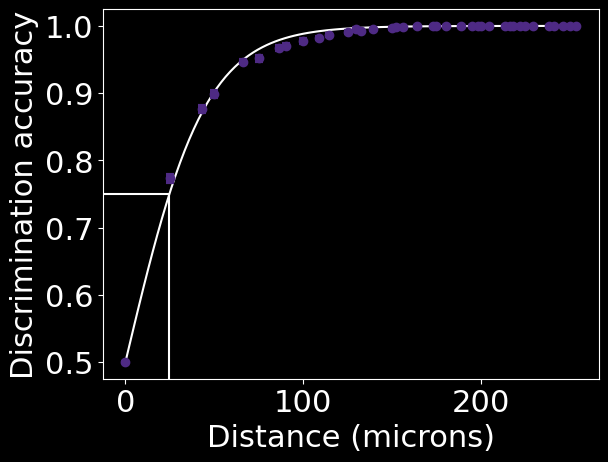

In [225]:
get_thresh(ytest.squeeze(), ptest.squeeze(), do_plotting=True)

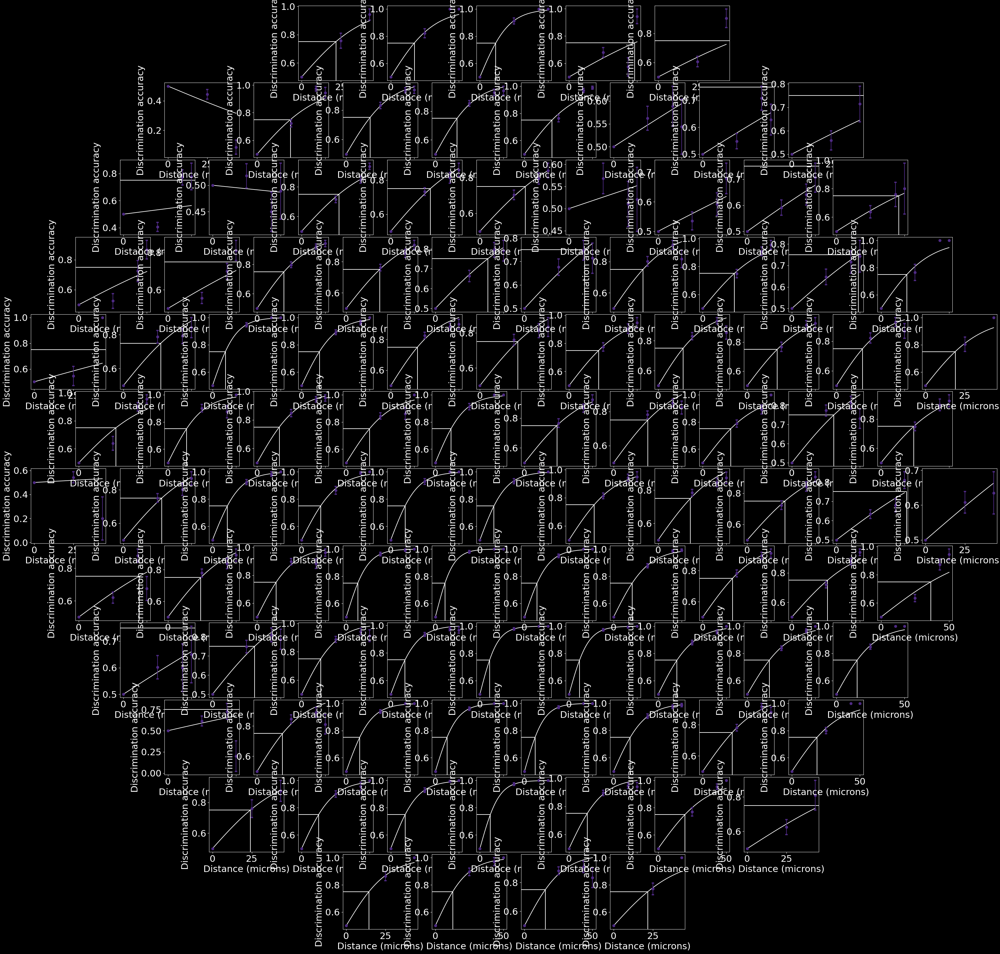

In [220]:
plt.figure(figsize=(25,25))

udist = np.sqrt(((u[:,None,:] - u[None,:,:])**2).sum(axis=-1))
th_map = np.zeros(u.shape[0])
for i,c in enumerate(u):
    j = np.argwhere(udist[i] < 30.1)
    
    k = np.isin(dui[test], j)
    # print(np.count_nonzero(k))

    t = (c + 105) / 210
    plt.axes([*t, .1, .1])

    th_map[i] = get_thresh(np.squeeze(ytest[k]), np.squeeze(ptest[k]), do_plotting=True)
    # th_map[i] = get_thresh(ytest[k], pstest[k], do_plotting=True)
    
th_map[th_map < 0] = np.infty

C:\Users\zfj\AppData\Local\Temp\ipykernel_2564\2982206097.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = mpl.cm.get_cmap('inferno')
C:\Users\zfj\AppData\Local\Temp\ipykernel_2564\2982206097.py:14: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, pad=.001)


7.089957848513535 378.8189079664283


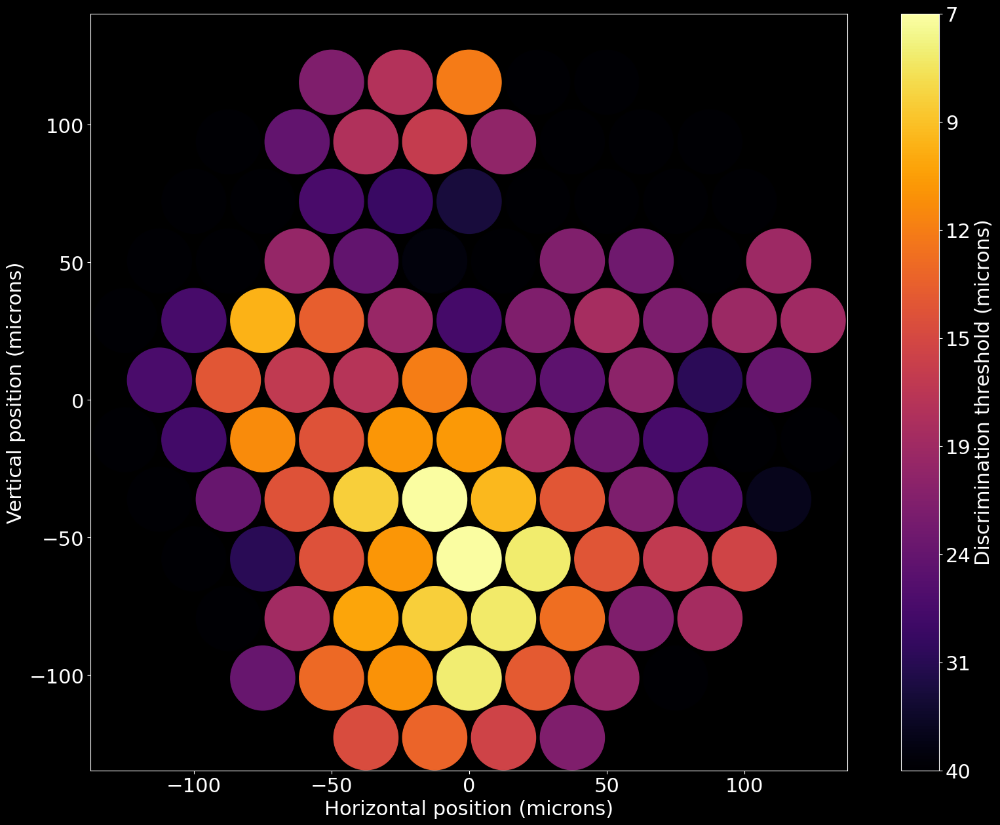

In [223]:
mpl.rcParams.update({'font.size': 22})


clim = [np.log10(7), np.log10(40)]

cmap = mpl.cm.get_cmap('inferno')
norm = mpl.colors.Normalize(vmin=-clim[1], vmax=-clim[0])

plt.figure(figsize=(20,15))
plt.scatter(*u.T, s=5000, c = cmap(norm(-np.log10(th_map))))

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)

cbar = plt.colorbar(sm, pad=.001)
cbar.set_label('Discrimination threshold (microns)')
cbar.ax.set_yticks(np.linspace(-clim[1],-clim[0],8))
cbar.ax.set_yticklabels([f"{10**abs(i):0.0f}" for i in np.linspace(-clim[1],-clim[0],8)])

plt.xlabel('Horizontal position (microns)')
plt.ylabel('Vertical position (microns)')

plt.axis('square')

print(th_map.min(), th_map[~np.isinf(th_map)].max())
plt.show()

# nosie corr: 9.418774481733289 2561.0183912263437
# no noise corr: 12.348962823119741 254.42476311805797


(-315.9664394981785, 326.2880091881892, -331.95254189048933, 310.3019067958784)

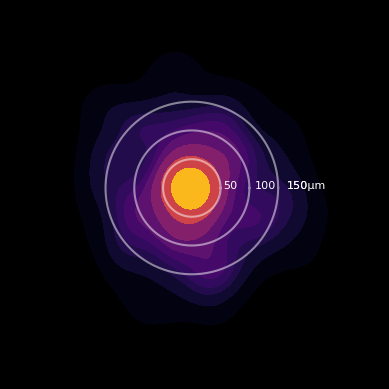

In [326]:
from seaborn import kdeplot

# plt.figure().add_subplot(projection='polar')
# sc = plt.scatter(edir, err, cmap='twilight')


edir = np.arctan2(ytest[:,-1,1] - ypred[:,-1,1], ytest[:,-1,0] - ypred[:,-1,0])


cbar=False

scale = 50

for i in range(1,4):
    th = np.linspace(0,2*np.pi,100)
    plt.plot(scale*i*np.cos(th), scale*i*np.sin(th), 'w', alpha=.5)
    plt.text(i*scale*1.1, 0, f"{i*scale}", fontsize=8)
plt.text(i*scale*1.1, 0, f"{i*scale}" + u'\u03bc' + 'm', fontsize=8)

kdeplot(x=err.flatten()*np.cos(edir), y=err.flatten()*np.sin(edir), fill=True, cmap='inferno', cbar=cbar)


# th = np.linspace(0,2*np.pi,5) + np.pi/4
# plt.plot(60*np.cos(th), 60*np.sin(th), 'w')


plt.axis('square')
plt.axis('off')

# plt.colorbar()



(array([ 2.,  3.,  5., 10., 29., 53., 16.,  4.,  3.,  2.]),
 array([0.12962963, 0.21666667, 0.3037037 , 0.39074074, 0.47777778,
        0.56481481, 0.65185185, 0.73888889, 0.82592593, 0.91296296,
        1.        ]),
 <BarContainer object of 10 artists>)

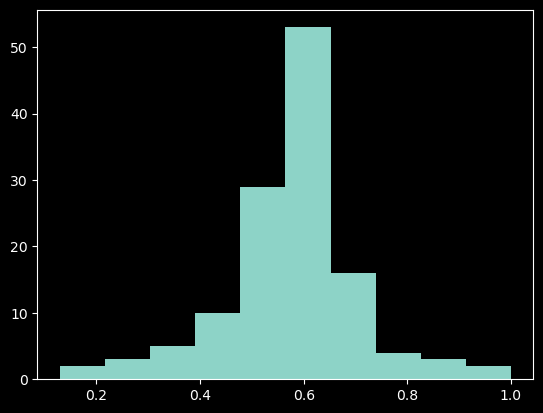

In [121]:
plt.hist(b)

(-249.95000000000002, 5248.95, -0.37, 0.07)

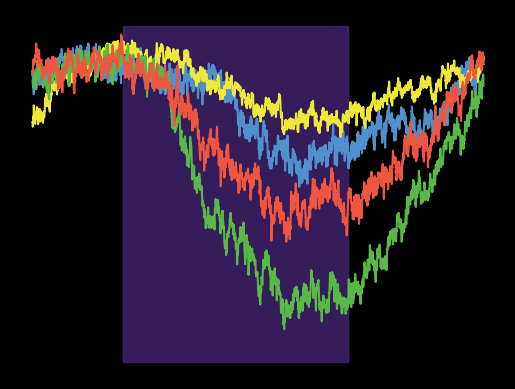

In [263]:
dmat.shape, dui.shape

# r = dmat[dui==10]
# r.shape
bl = dmat[:,:,:1500].mean(axis=-1, keepdims=True)
r = (dmat - bl)
mx = np.max(np.abs(r), axis=(0,-1), keepdims = True)
r = r / mx

plt.fill_between([1000, 3500], .05, -.35, color='#4E2A84AF')


ii = 45 # 91, 4, 28, 45, 81

plt.plot(r[dui==ii].mean(axis=0)[0], color="#5091CD")
plt.plot(r[dui==ii].mean(axis=0)[1], color="#EDE93B")
plt.plot(r[dui==ii].mean(axis=0)[2], color="#58B947")
plt.plot(r[dui==ii].mean(axis=0)[3], color="#EF553F")


#g and c are c1/c3
#r and m are c2/c4

plt.axis('off')

In [260]:
t = np.flip(dui[np.argsort(r[:,3,100:].max(axis=1))])

t
# dui[987]

array([99, 41, 81, ...,  0, 67, 48])

In [98]:
e[0], popt

# logifunc(0,*popt)

# # print(.606 / (1 + np.exp(-.04*0)))

# print(1 / (1 + np.exp(-.04*0)))

(0.5, array([0.16501717, 1.        ]))

In [78]:
from sklearn.svm import SVC
from util import info


In [137]:
I = info.svm_info(dmat.reshape((-1,4*5000)), dui, 102, ncomps=10)
I

c:\Users\zfj\code\functionalimaginganalysis\python\util\info.py:39: RuntimeWarning: divide by zero encountered in log2
  HRS = -np.nansum(self.Py_x * np.log2(self.Py_x) * self.stim_prob)
c:\Users\zfj\code\functionalimaginganalysis\python\util\info.py:39: RuntimeWarning: invalid value encountered in multiply
  HRS = -np.nansum(self.Py_x * np.log2(self.Py_x) * self.stim_prob)
c:\Users\zfj\code\functionalimaginganalysis\python\util\info.py:55: RuntimeWarning: divide by zero encountered in log2
  HRS_ind = -np.nansum(Py_x_ind * np.log2(Py_x_ind) * self.stim_prob)
c:\Users\zfj\code\functionalimaginganalysis\python\util\info.py:55: RuntimeWarning: invalid value encountered in multiply
  HRS_ind = -np.nansum(Py_x_ind * np.log2(Py_x_ind) * self.stim_prob)
c:\Users\zfj\code\functionalimaginganalysis\python\util\info.py:56: RuntimeWarning: divide by zero encountered in log2
  HRS_sh = -np.nansum(self.Py_x_sh * np.log2(self.Py_x_sh) * self.stim_prob)
c:\Users\zfj\code\functionalimaginganalysis\py

2.3122571122168494

c:\Users\zfj\code\functionalimaginganalysis\python\util\info.py:38: RuntimeWarning: divide by zero encountered in log2
  HR = -np.nansum(self.Py * np.log2(self.Py))
c:\Users\zfj\code\functionalimaginganalysis\python\util\info.py:38: RuntimeWarning: invalid value encountered in multiply
  HR = -np.nansum(self.Py * np.log2(self.Py))
c:\Users\zfj\code\functionalimaginganalysis\python\util\info.py:39: RuntimeWarning: divide by zero encountered in log2
  HRS = -np.nansum(self.Py_x * np.log2(self.Py_x) * self.stim_prob)
c:\Users\zfj\code\functionalimaginganalysis\python\util\info.py:39: RuntimeWarning: invalid value encountered in multiply
  HRS = -np.nansum(self.Py_x * np.log2(self.Py_x) * self.stim_prob)
c:\Users\zfj\code\functionalimaginganalysis\python\util\info.py:55: RuntimeWarning: divide by zero encountered in log2
  HRS_ind = -np.nansum(Py_x_ind * np.log2(Py_x_ind) * self.stim_prob)
c:\Users\zfj\code\functionalimaginganalysis\python\util\info.py:55: RuntimeWarning: invalid value enc

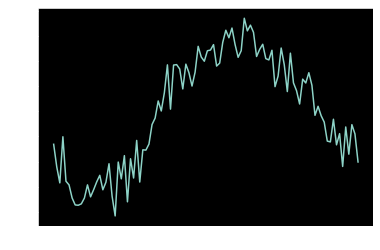

In [152]:
mod = info.MI(dui, 4, 4)
MI_t = [ mod.QE(dmat[:,:,t]) for t in np.arange(0,5000,50)] 
# It = [info.svm_info(dmat.reshape((-1,4*5000)), dui, 102, ncomps=10)]
plt.plot(MI_t)

In [94]:
fdata = dmat.reshape((-1,4*5000))
fdata.shape, dui.shape

((2440, 20000), (2440,))

In [132]:
from sklearn.model_selection import KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA

from sklearn.svm import LinearSVR
from sklearn.multioutput import RegressorChain

cv = KFold(10, shuffle=True)
# n_comps = np.linspace(50,500,25).astype(int)
n_comps = 20
# y_hats = np.empty((len(n_comps),len(dui),2))
y_hats = np.empty((len(dui),2))
for train, test in cv.split(fdata):
        mms = MinMaxScaler().fit(fdata[train])

        # pca = PCA(200, whiten=True)
        pca = PCA(n_comps, whiten=True)
        comps = pca.fit_transform(mms.transform(fdata[train]))
        
        # for i in range(len(n_comps)):
        #     mod = RegressorChain(LinearSVR(C=1000.0))
        #     mod.fit(comps[:,:n_comps[i]], u[dui[train],:])
        #     y_hats[i,test,:] = mod.predict(np.ascontiguousarray(pca.transform(mms.transform(fdata[test]))[:,:n_comps[i]]))

        
        mod = RegressorChain(LinearSVR(C=1000.0, max_iter=20000))
        mod.fit(comps, u[dui[train],:])
        y_hats[test,:] = mod.predict(np.ascontiguousarray(pca.transform(mms.transform(fdata[test]))))

        print('.')


c:\Users\zfj\anaconda3\envs\suite2p\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


.


c:\Users\zfj\anaconda3\envs\suite2p\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\Users\zfj\anaconda3\envs\suite2p\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


.


c:\Users\zfj\anaconda3\envs\suite2p\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\Users\zfj\anaconda3\envs\suite2p\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


.


c:\Users\zfj\anaconda3\envs\suite2p\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\Users\zfj\anaconda3\envs\suite2p\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


.


c:\Users\zfj\anaconda3\envs\suite2p\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\Users\zfj\anaconda3\envs\suite2p\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


.


c:\Users\zfj\anaconda3\envs\suite2p\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\Users\zfj\anaconda3\envs\suite2p\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


.


c:\Users\zfj\anaconda3\envs\suite2p\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\Users\zfj\anaconda3\envs\suite2p\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


.


c:\Users\zfj\anaconda3\envs\suite2p\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\Users\zfj\anaconda3\envs\suite2p\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


.


c:\Users\zfj\anaconda3\envs\suite2p\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\Users\zfj\anaconda3\envs\suite2p\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


.


c:\Users\zfj\anaconda3\envs\suite2p\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


.


c:\Users\zfj\anaconda3\envs\suite2p\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [134]:
svm_i = info.MI(dui, ndims=2)
# MI_s = [[svm_i.QE(y_hats[i,:,:]) for i in range(len(n_comps))] for _ in range(10)]
MI_s = [svm_i.QE(y_hats) for _ in range(10)]
MI_s

c:\Users\zfj\code\functionalimaginganalysis\python\util\info.py:38: RuntimeWarning: divide by zero encountered in log2
  HR = -np.nansum(self.Py * np.log2(self.Py))
c:\Users\zfj\code\functionalimaginganalysis\python\util\info.py:38: RuntimeWarning: invalid value encountered in multiply
  HR = -np.nansum(self.Py * np.log2(self.Py))
c:\Users\zfj\code\functionalimaginganalysis\python\util\info.py:39: RuntimeWarning: divide by zero encountered in log2
  HRS = -np.nansum(self.Py_x * np.log2(self.Py_x) * self.stim_prob)
c:\Users\zfj\code\functionalimaginganalysis\python\util\info.py:39: RuntimeWarning: invalid value encountered in multiply
  HRS = -np.nansum(self.Py_x * np.log2(self.Py_x) * self.stim_prob)
c:\Users\zfj\code\functionalimaginganalysis\python\util\info.py:55: RuntimeWarning: divide by zero encountered in log2
  HRS_ind = -np.nansum(Py_x_ind * np.log2(Py_x_ind) * self.stim_prob)
c:\Users\zfj\code\functionalimaginganalysis\python\util\info.py:55: RuntimeWarning: invalid value enc

[0.4422492849617038,
 0.4248736066682295,
 0.4822283176878691,
 0.4301068178437152,
 0.49247822617988374,
 0.389370330168009,
 0.376724061012057,
 0.417053992863303,
 0.3562644534697908,
 0.44073628183544655]

31.789086255263324 59.54697095764297 4139.094566839257 4074.4454640933477
89.47949500114676


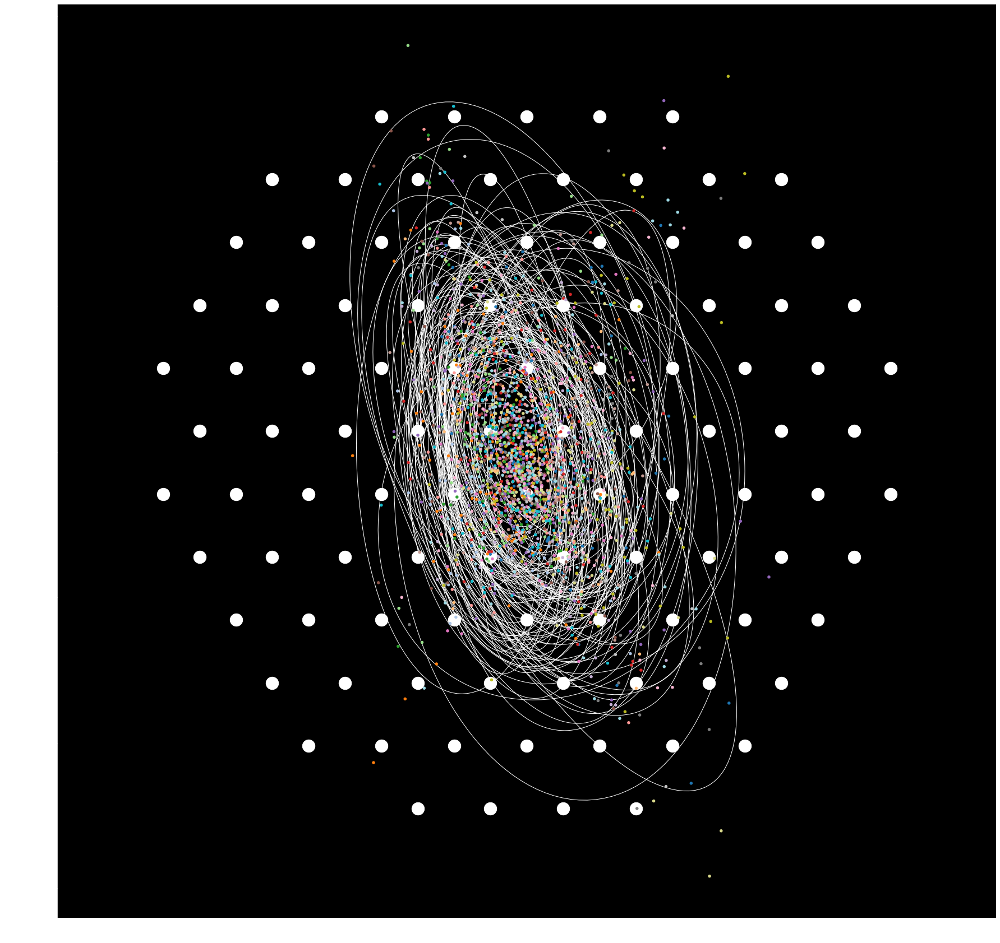

In [135]:
from matplotlib.patches import Ellipse

import matplotlib.transforms as transforms

plt.figure(figsize=(30,30))
ax = plt.gca()

n_std=2
scale_x = np.empty(len(u))
scale_y = np.empty(len(u))
mean_x = np.empty(len(u))
mean_y = np.empty(len(u))

for i in range(len(u)):
    cov = np.cov(y_hats[dui==i,0], y_hats[dui==i,1])
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x * 2, height=ell_radius_y * 2, facecolor='None', edgecolor='w')
    scale_x[i] = np.sqrt(cov[0, 0]) * n_std
    mean_x[i] = np.mean(y_hats[dui==i,0])

    # calculating the standard deviation of y ...
    scale_y[i] = np.sqrt(cov[1, 1]) * n_std
    mean_y[i] = np.mean(y_hats[dui==i,1])

    transf = transforms.Affine2D() \
        .rotate_deg(45) \
        .scale(scale_x[i], scale_y[i]) \
        .translate(mean_x[i], mean_y[i])

    ellipse.set_transform(transf + ax.transData)
    ax.add_patch(ellipse)

plt.scatter(u[:,0], u[:,1], s=500, color='white')

plt.scatter(y_hats[:,0], y_hats[:,1], s=20, c=dui, alpha=1, cmap='tab20')

plt.xticks(fontsize=32)
plt.yticks(fontsize=32)


plt.axis('equal')
# plt.xlim(-65,65)
# plt.ylim(-65,65)

# plt.grid('on')

# plt.xlim([-30,-10])
# plt.ylim([-15,1.5])
print(scale_x.mean(), scale_y.mean(), ((mean_x - u[:,0])**2).mean(), ((mean_y - u[:,1])**2).mean())
print(np.asarray([np.sqrt((y_hats[dui==i,0] - u[i,0])**2 + (y_hats[dui==i,1] - u[i,1])**2).mean(axis=0) for i in range(len(u))]).mean())

In [256]:
fdat = np.moveaxis(dmat,2,1)
fdat = fdat - fdat[:,:500,:].mean(axis=1, keepdims=True)
print(dmat.shape, fdat.shape, u[dui].shape)

(2440, 4, 5000) (2440, 5000, 4) (2440, 2)


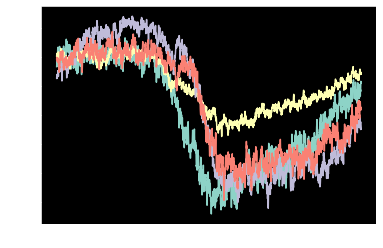

In [258]:
plt.plot(fdat[dui == 0].mean(axis=0))
plt.show()

In [259]:
from sklearn.model_selection import StratifiedKFold
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
# from sklearn.model_selection import train_test_split

cv = StratifiedKFold(5, shuffle=True, random_state=0)
train, test = list(cv.split(fdat.reshape(-1,4*5000), dui))[0]
xtrain, xtest = fdat[train], fdat[test]
ytrain, ytest = u[dui[train], None, :], u[dui[test], None, :]
ltrain, ltest = dui[train], dui[test]

In [292]:
tmri = layers.Input((None,4))
ffns = []
cnv1 = tmri
for _ in range(2):
    for i in range(9):
        cnv1 = layers.SeparableConv1D(32, 2, dilation_rate=2**i, padding='causal')(cnv1)
        cnv1 = layers.LayerNormalization()(cnv1)
        cnv1 = layers.Activation('relu')(cnv1)
        cnv1 = layers.SeparableConv1D(4, 1)(cnv1)
        cnv1 = layers.LayerNormalization()(cnv1)
        cnv1 = layers.Add()([cnv1, tmri])
        ffns.append(cnv1)
    cnv1 = layers.Add()([*ffns, tmri])
ffnt = layers.Activation('sigmoid')(cnv1)
ffnt = layers.Dense(2)(ffnt)
tm_mod = keras.Model(inputs=tmri, outputs = ffnt)

# tmri = layers.Input(1000)
# ti = layers.Dense(128)(tmri)
# c = ti
# for i in range(8):
#     d = layers.Dense(128, activation='sigmoid')(c)
#     c = layers.Add()([d,ti])
# d2 = layers.Dense(16, activation='sigmoid')(c)
# o = layers.Dense(2)(d2)
# tm_mod = keras.Model(inputs=tmri, outputs=o)

# tmri = layers.Input(1000)
# # cnv1 = layers.Conv1D(32,500, activation='relu', padding='causal')(tmri)
# d = layers.Dense(16, activation='relu')(tmri)
# o = layers.Dense(2)(d)
# tm_mod = keras.Model(inputs=tmri, outputs=o)




# tmri = layers.Input(1000)
# # cnv1 = layers.Conv1D(32,500, activation='relu', padding='causal')(tmri)
# d = layers.Dense(128, activation='relu')(tmri)
# d = layers.Dense(128, activation='sigmoid')(d)
# o = layers.Dense(102)(d)
# tm_mod = keras.Model(inputs=tmri, outputs=o)



In [293]:
tm_mod.compile(
    loss = keras.losses.MeanSquaredError(),
    # optimizer=keras.optimizers.Adam(learning_rate=1),
    optimizer=keras.optimizers.RMSprop(learning_rate=0.1)
)

# tm_mod.compile(
#     optimizer=keras.optimizers.Adam(learning_rate=1),
#     loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
#     metrics=['accuracy'])

# tm_history = tm_mod.fit(xtrain[:,1::20,:].reshape(-1,1000), ltrain, validation_data=(xtest[:,1::20,:].reshape(-1,1000),ltest), epochs=200, callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',restore_best_weights=True, patience=50, verbose=1))


# tm_history = tm_mod.fit(xtrain[:,1::20,:].reshape(-1,1000), ytrain.reshape(-1,2), validation_data=(xtest[:,1::20,:].reshape(-1,1000),ytest.reshape(-1,2)), epochs=200, callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss',restore_best_weights=True, patience=20, verbose=1))
tm_history = tm_mod.fit(xtrain, ytrain, validation_data=(xtest,ytest), epochs=200, callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss',restore_best_weights=True, patience=20, verbose=1))


Epoch 1/200
61/61 [==============================] - 361s 6s/step - loss: 4370.5225 - val_loss: 4383.2515
Epoch 2/200
61/61 [==============================] - 374s 6s/step - loss: 4367.4849 - val_loss: 4383.4541
Epoch 3/200
61/61 [==============================] - 361s 6s/step - loss: 4367.2095 - val_loss: 4381.7778
Epoch 4/200
61/61 [==============================] - 386s 6s/step - loss: 4366.7544 - val_loss: 4382.3501
Epoch 5/200
61/61 [==============================] - 377s 6s/step - loss: 4366.6357 - val_loss: 4382.1108
Epoch 6/200
61/61 [==============================] - 373s 6s/step - loss: 4365.1455 - val_loss: 4381.7915
Epoch 7/200
61/61 [==============================] - 359s 6s/step - loss: 4364.6899 - val_loss: 4381.9507
Epoch 8/200
61/61 [==============================] - 361s 6s/step - loss: 4362.9521 - val_loss: 4382.0996
Epoch 9/200
32/61 [==============>...............] - ETA: 2:38 - loss: 4238.4629

KeyboardInterrupt: 

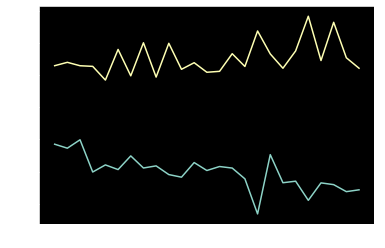

In [289]:
plt.plot(tm_history.history['loss'])
plt.plot(tm_history.history['val_loss'])

16/16 [==============================] - 0s 2ms/step


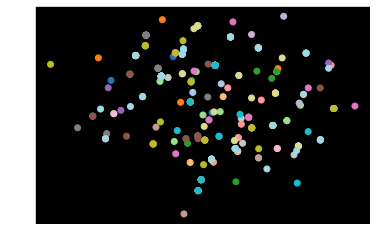

In [291]:
rctest = tm_mod.predict(xtest[:,1::20,:].reshape(-1,1000))

# print(rctest.shape)
plt.scatter(rctest[:,0],rctest[:,1], c = ltest, cmap='tab20')
